# GUC NETW 1003 Kmeans Assginmnet 

Objective: exercise is to learn how to use build and use  kmeans clustering algortrithm    

At the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means Algorithm 
> 2. Understand the effect of the parmeters ont he perfromance of the algorithm .
> 3. Understand the effect of distance.

## 1. Wirte K means function 

import required libraries 

In [6]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons

> ### 1.1. Code for the distance function 

write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type) 
* The function shoud be able to handel data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Ecluidian distance
    - Pearson correlation distance
  

In [246]:
def GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type ):
## write code here for the Distance function here # 
    Cluster_Distance = np.zeros((len(Data_points), len(Cluster_Centroids)))
    if (Distance_Type == 'Ecluidian'):
        c = 0
        for i in Cluster_Centroids:
            r = 0
            for j in Data_points:
                Cluster_Distance[r][c] = np.linalg.norm(j-i)
                r+=1
            c+=1
    if (Distance_Type == 'Pearson'):
        """c = 0
        for i in Cluster_Centroids:
            r = 0
            for j in Data_points:
                Xavg = np.mean(j)
                Cavg = np.mean(i)
                jnew = j - Xavg
                inew = i - Cavg
                top = np.dot(inew,jnew)
                bot = np.sqrt(np.dot(inew,inew)*np.dot(jnew,jnew))
                Cluster_Distance[r][c] = 1-(top/bot)
                r+=1
            c+=1
        """
        c = 0
        for i in Cluster_Centroids:
            r = 0
            for j in Data_points:
                cov = np.cov(i,j)
                cor = cov[0,1] / np.sqrt(cov[0,0] * cov[1,1])
                Cluster_Distance[r,c] = 1 - cor
                r+=1
            c+=1
            """1-(np.cov(i,j)[1,0]/(np.std(i)*np.std(j)))"""

    return Cluster_Distance 


> ### 1.2. Code for K means function 

> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assginmnet 
> > > * Use the GUC_Distance to calculate between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * for each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Updtate Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [313]:
def GUC_Kmean ( Data_points, Number_of_Clusters,  Distance_Type ):
   Cluster_Metric = np.zeros((Number_of_Clusters))
   loc = np.random.choice(np.arange(0, len(Data_points)), size=Number_of_Clusters, replace=False)
   centroids = []
   for i in loc:
      centroids.append(Data_points[i])
   #write your your loop
   Assigned_Cluster = np.zeros((len(Data_points)))
   Distance_values = np.zeros((len(Data_points)))
   old_metric=100000
   while True:
      Clus_Dis = GUC_Distance(centroids, Data_points, Distance_Type)
      c = 0
      for i in Data_points:
         Assigned_Cluster[c] = np.argmin(Clus_Dis[c])
         Distance_values[c] = np.min(Clus_Dis[c])
         c+=1
      mse = []
      new_centroids = []

      Cluster_Metric = 0
      for i in range (Number_of_Clusters):
         points_loc = np.where(Assigned_Cluster == i)
         if np.size(points_loc) == 0:
            new_centroids.append(Data_points[np.random.randint(0,len(Data_points))])
         else:
            cluster = Data_points[points_loc]
            mean = np.mean(cluster, axis=0)
            new_centroids.append(mean)
            """print(cluster[1])
            print(mean)
            print((cluster-mean)[1])
            print(np.mean((cluster - mean)**2,axis = 0))
            print('--------------')"""
            mse.append(np.mean((cluster - mean)**2))
      Cluster_Metric = np.mean((Distance_values)**2)
      check = np.sum(mse)
      if old_metric<= Cluster_Metric:
         Final_Cluster_Distance = Assigned_Cluster
         break
      else:
         old_metric = Cluster_Metric
         centroids = new_centroids



      
    
   return [ Final_Cluster_Distance , Cluster_Metric ]    

## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [11]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [191]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(Distance_Type,printing,X,km=[],num_clusters=0):
    color = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#1f77b4', '#ff7f0e', '#2ca02c']  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        n = X.shape[1]
        if n ==2:
            for k in range(num_clusters):
                plt.scatter(X[np.where(km==k),0],X[np.where(km==k),1],c = color[k],alpha = alpha,s=s)
        else:
            fig, axes = plt.subplots(n, n,figsize=(30,30))
            for i in range(n):
                for j in range(n):
                    if i!=j:
                        for k in range(num_clusters):
                            axes[i,j].scatter(X[np.where(km==k),i],X[np.where(km==k),j],c = color[k],alpha = alpha,s=s)
                            #plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)
    plt.suptitle(f"this is the figure of {printing} for {num_clusters} clusters with {Distance_Type} distance")
    plt.show()

> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

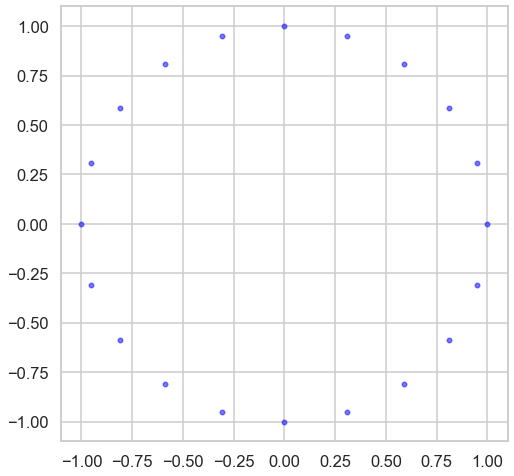

In [5]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")
# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

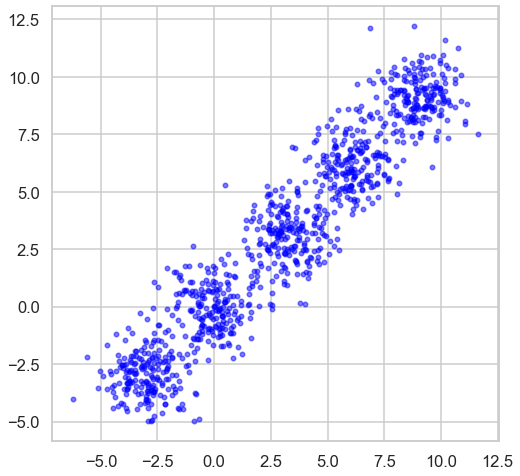

In [6]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(X)

#### 2.3. Example 3 : moons Data Gen and display 

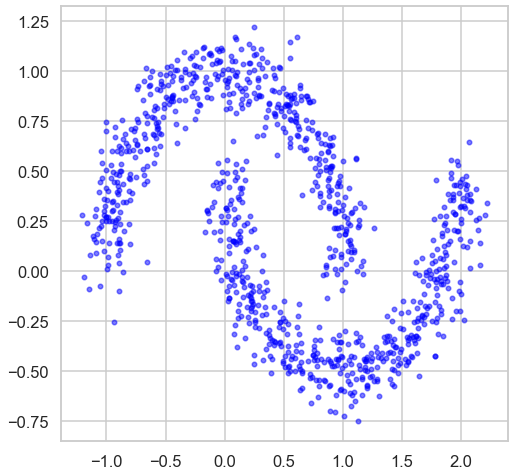

In [18]:
n_samples = 1000
X, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(X)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

In [253]:
#Example 1
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X1 = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()

#Example 2
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X2, y2 = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
#Example 3
n_samples3 = 1000
X3, y3 = noisy_moons = make_moons(n_samples=n_samples3, noise= .1)

ks = [2,3,4,5,6,7,8,9,10]


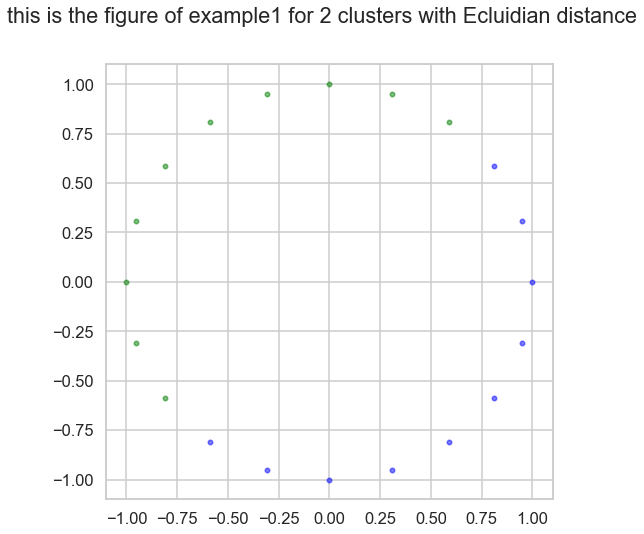

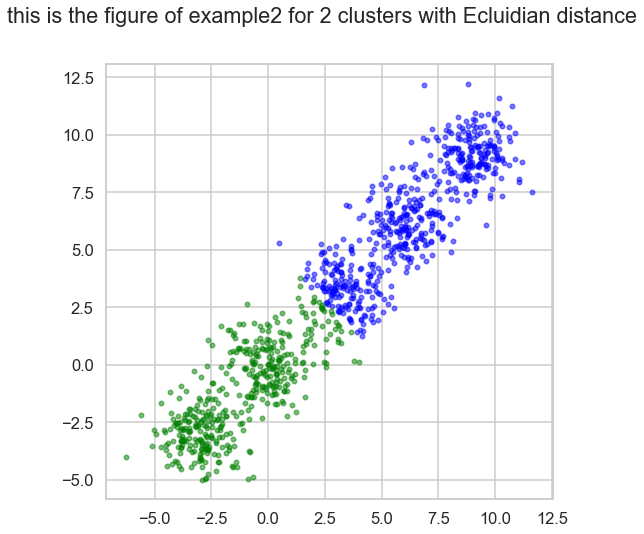

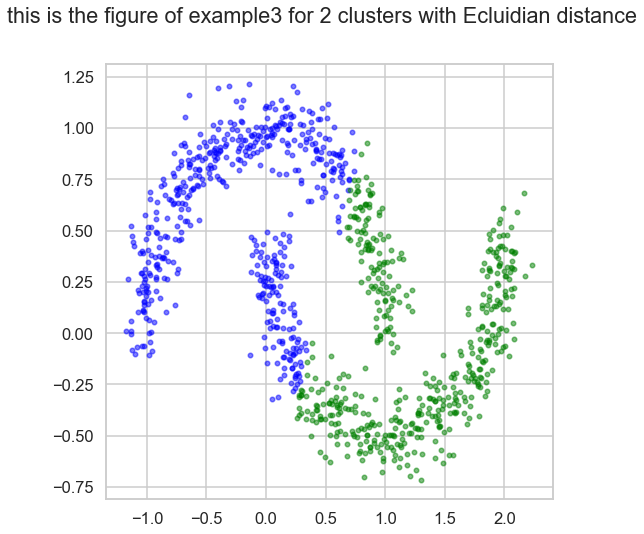

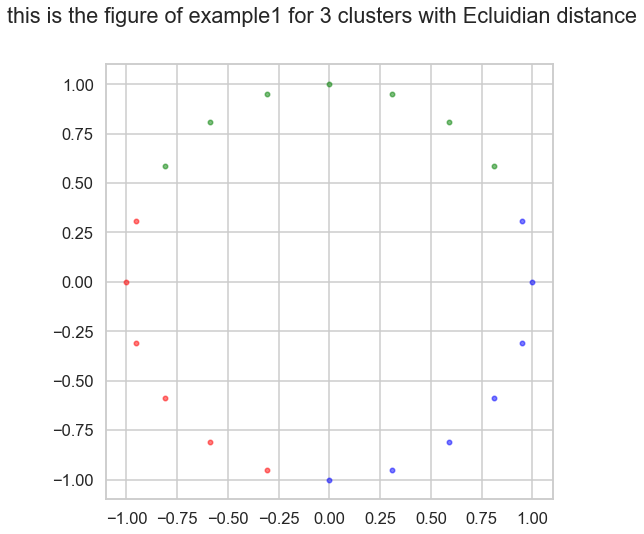

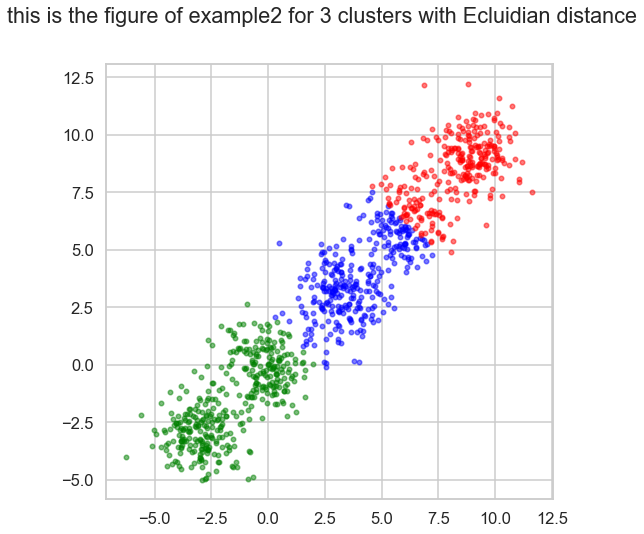

...

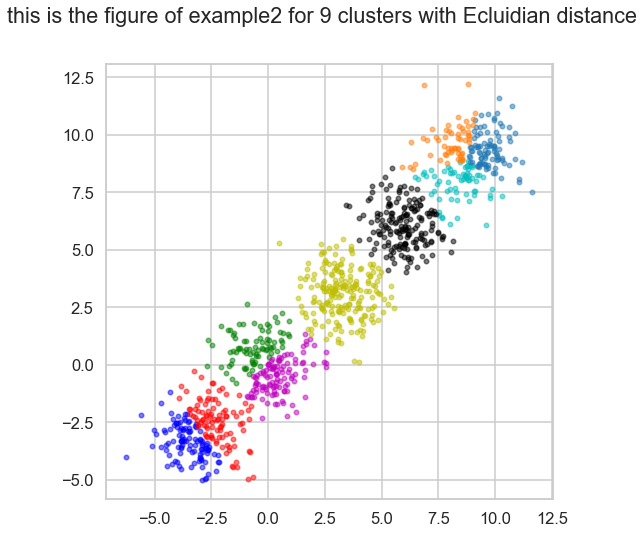

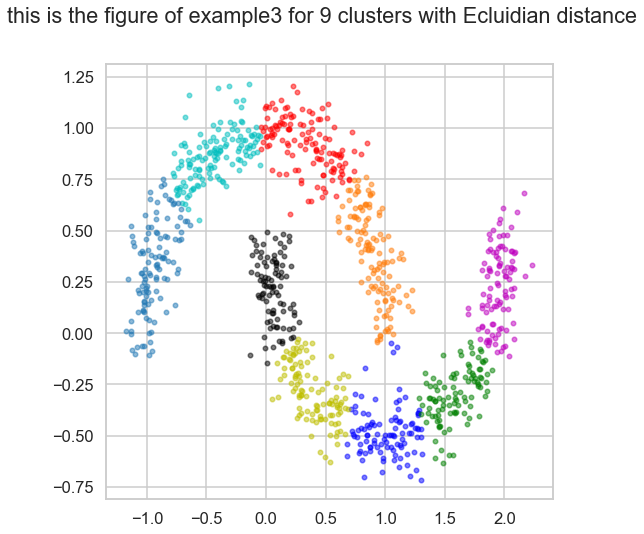

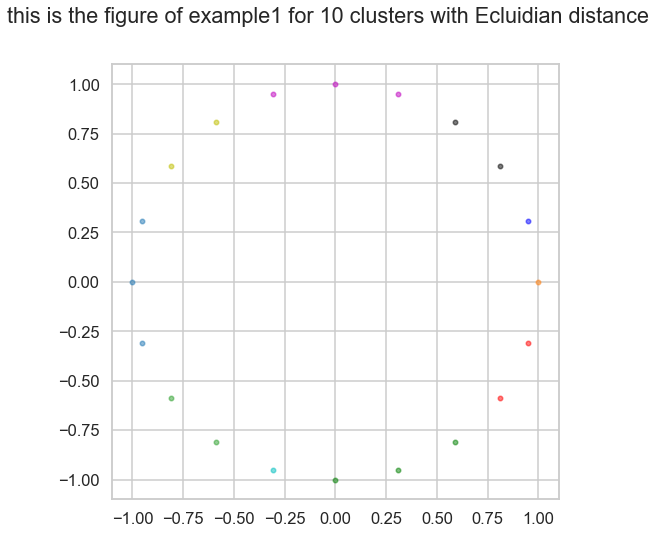

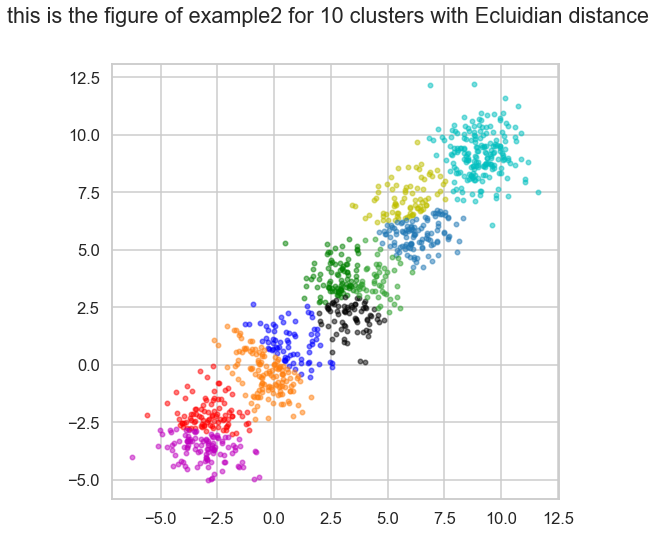

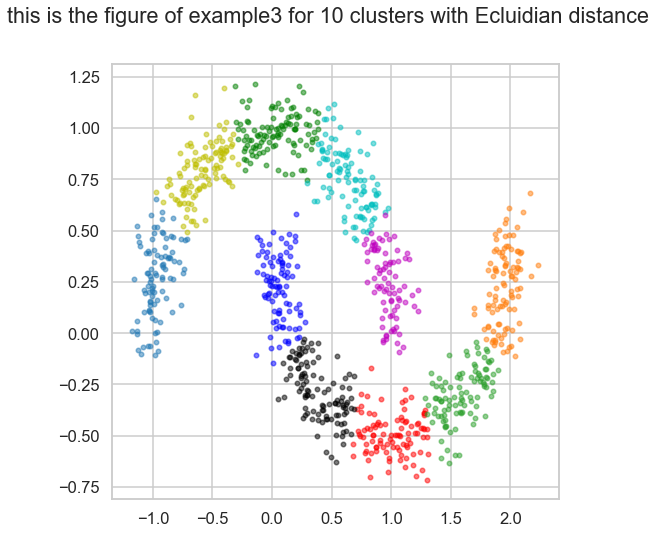

In [268]:
Cluster_metrics1=[]
Cluster_metrics2=[]
Cluster_metrics3=[]

for i in ks:
    c_d1, c_m1 = GUC_Kmean(Data_points=X1, Number_of_Clusters=i, Distance_Type='Ecluidian')
    c_d2, c_m2 = GUC_Kmean(Data_points=X2, Number_of_Clusters=i, Distance_Type='Ecluidian')
    c_d3, c_m3 = GUC_Kmean(Data_points=X3, Number_of_Clusters=i, Distance_Type='Ecluidian')
    Cluster_metrics1.append(c_m1)
    Cluster_metrics2.append(c_m2)
    Cluster_metrics3.append(c_m3)
    display_cluster('Ecluidian',"example1",X1, km=c_d1, num_clusters=i)
    display_cluster('Ecluidian',"example2",X2, km=c_d2, num_clusters=i)
    display_cluster('Ecluidian',"example3",X3, km=c_d3, num_clusters=i)


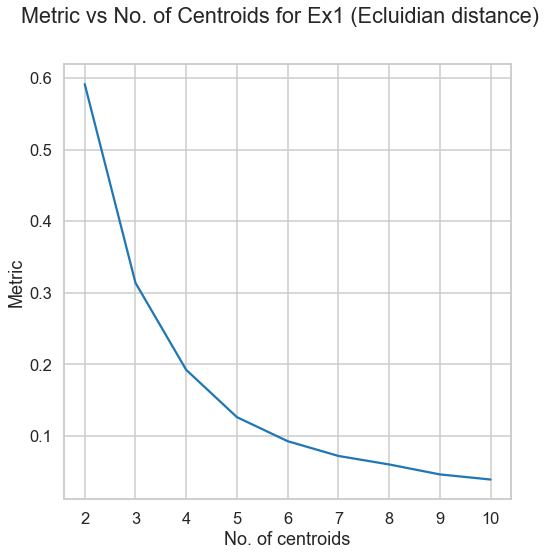

In [269]:
plt.plot(ks,Cluster_metrics1)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Ex1 (Ecluidian distance)')
plt.show()

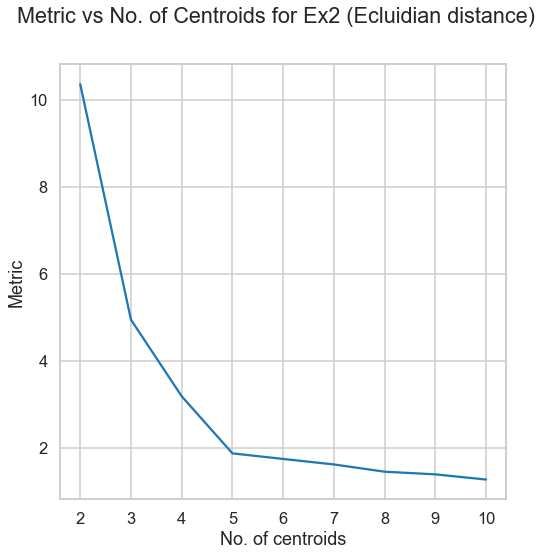

In [270]:
plt.plot(ks,Cluster_metrics2)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Ex2 (Ecluidian distance)')
plt.show()

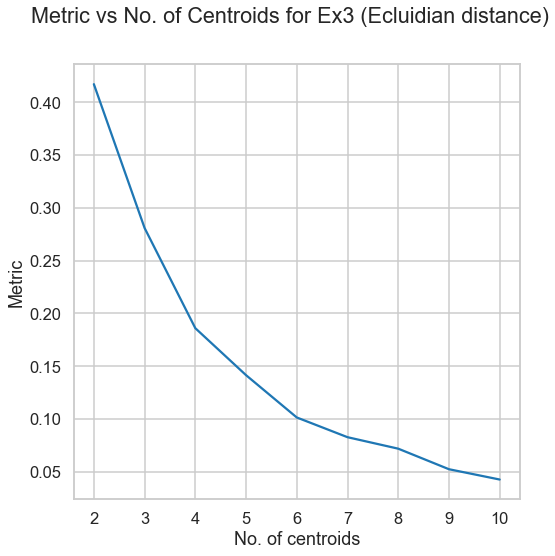

In [271]:
plt.plot(ks,Cluster_metrics3)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Ex3 (Ecluidian distance)')
plt.show()

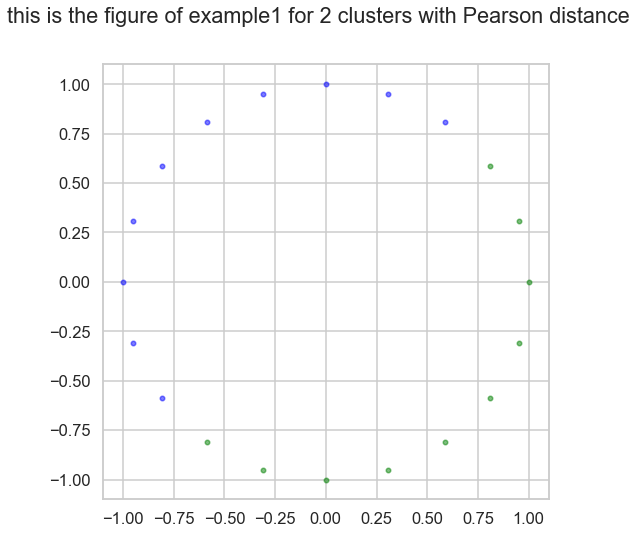

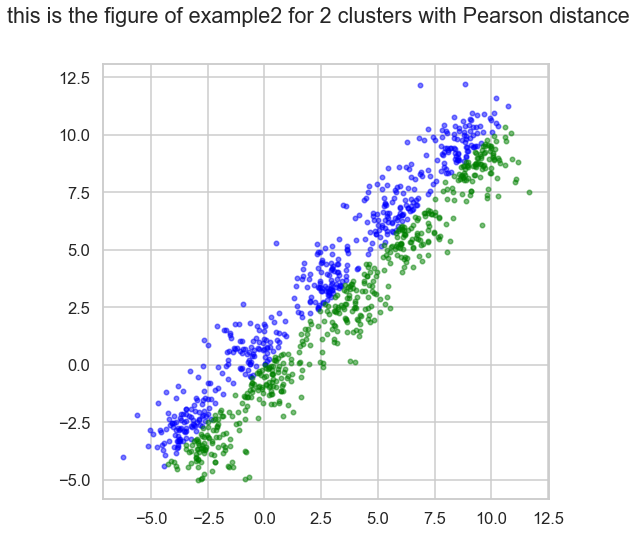

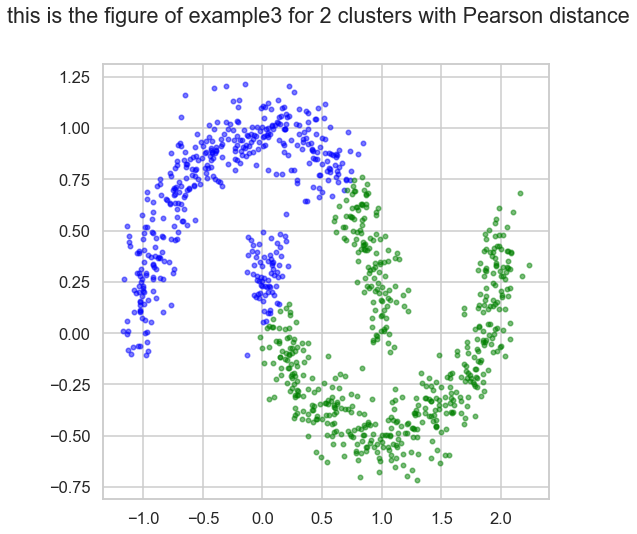

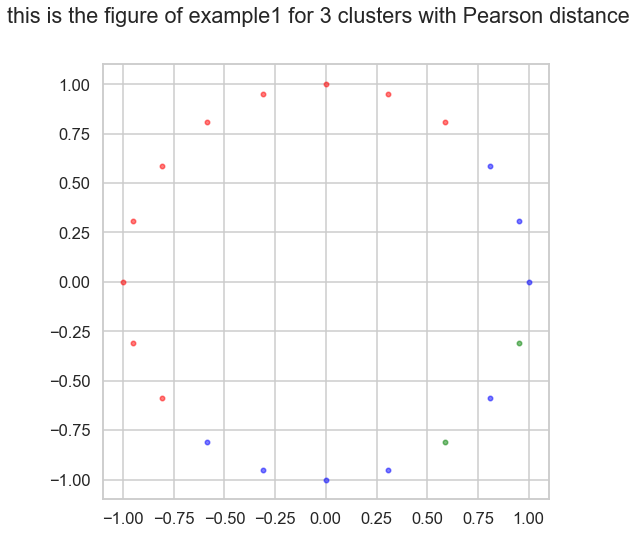

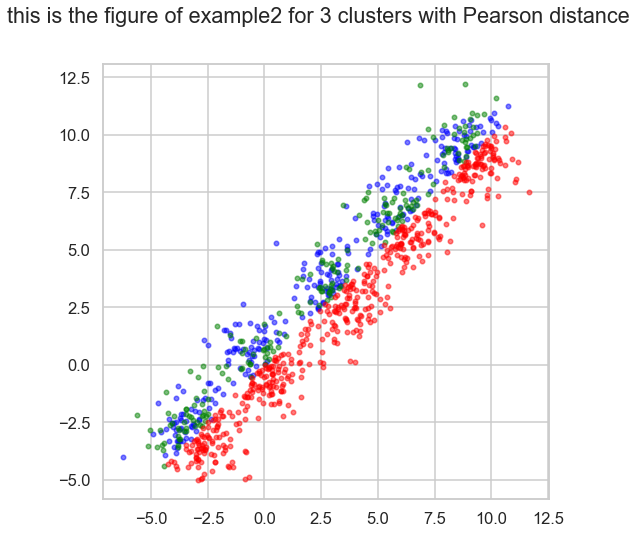

...

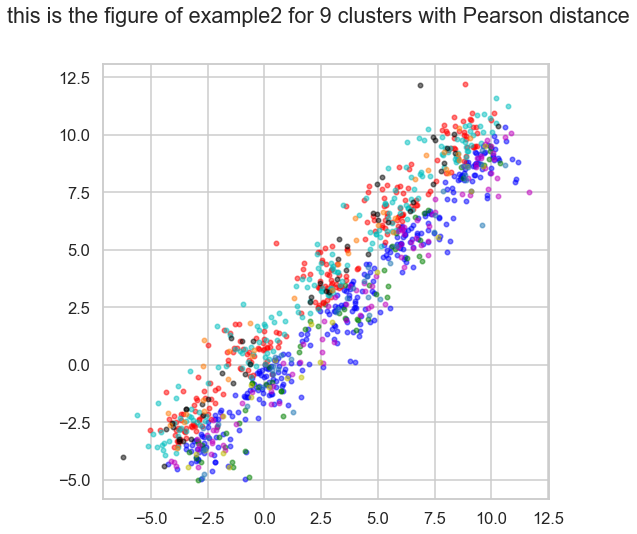

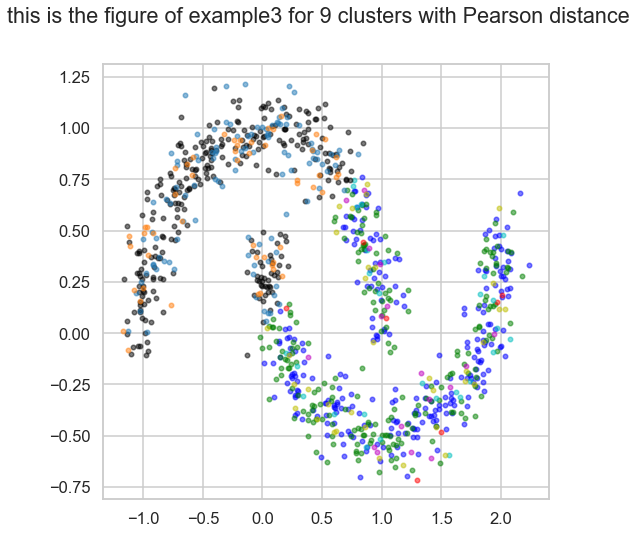

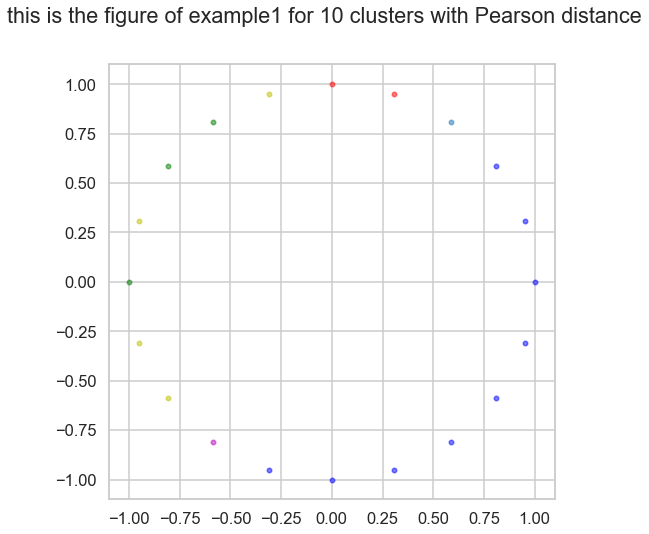

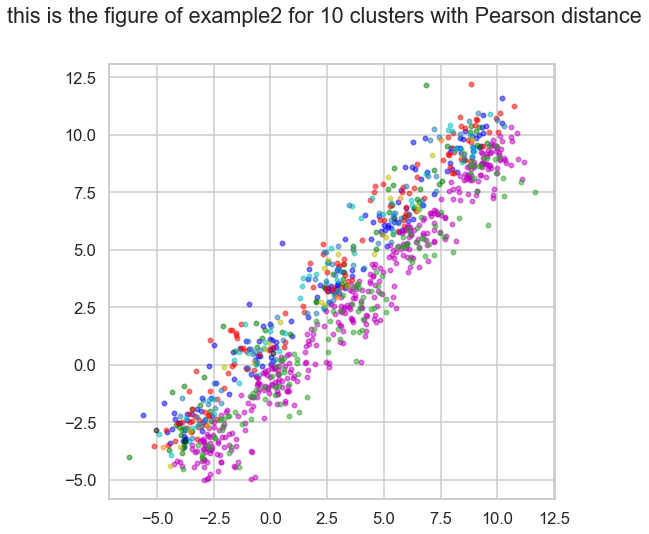

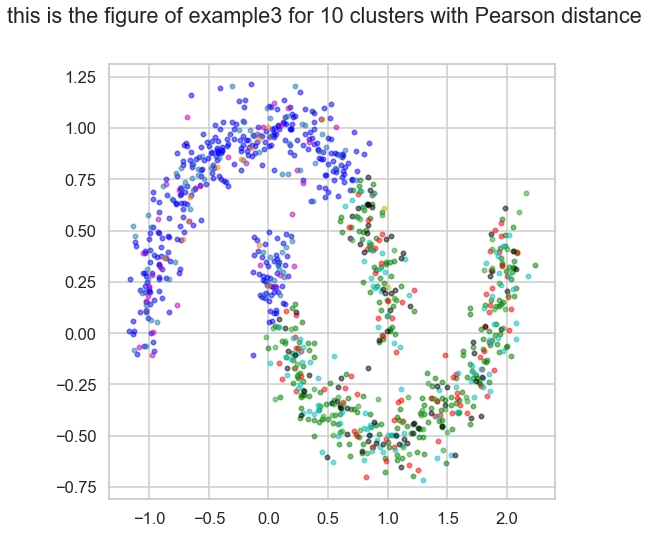

In [314]:
pCluster_metrics1=[]
pCluster_metrics2=[]
pCluster_metrics3=[]

for i in ks:
    c_d1, c_m1 = GUC_Kmean(Data_points=X1, Number_of_Clusters=i, Distance_Type='Pearson')
    c_d2, c_m2 = GUC_Kmean(Data_points=X2, Number_of_Clusters=i, Distance_Type='Pearson')
    c_d3, c_m3 = GUC_Kmean(Data_points=X3, Number_of_Clusters=i, Distance_Type='Pearson')
    pCluster_metrics1.append(c_m1)
    pCluster_metrics2.append(c_m2)
    pCluster_metrics3.append(c_m3)
    display_cluster('Pearson',"example1",X1, km=c_d1, num_clusters=i)
    display_cluster('Pearson',"example2",X2, km=c_d2, num_clusters=i)
    display_cluster('Pearson',"example3",X3, km=c_d3, num_clusters=i)

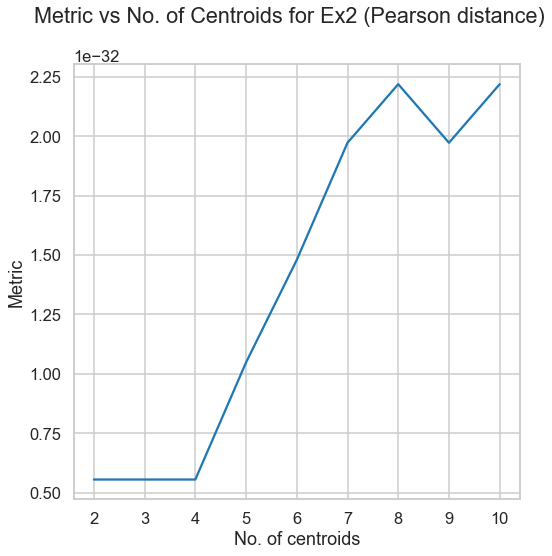

In [315]:
plt.plot(ks,pCluster_metrics1)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Ex2 (Pearson distance)')
plt.show()

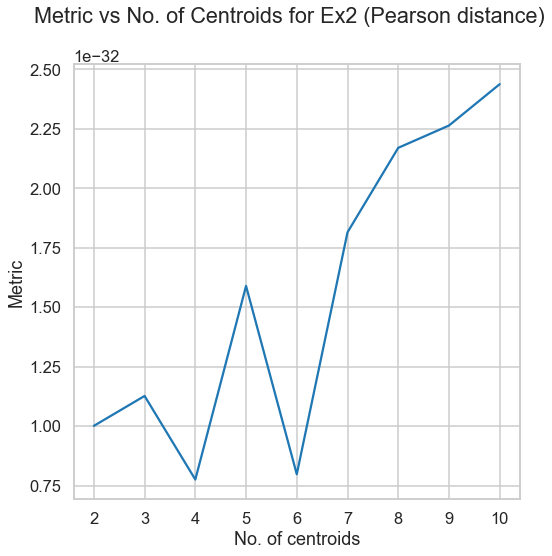

In [316]:
plt.plot(ks,pCluster_metrics2)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Ex2 (Pearson distance)')
plt.show()

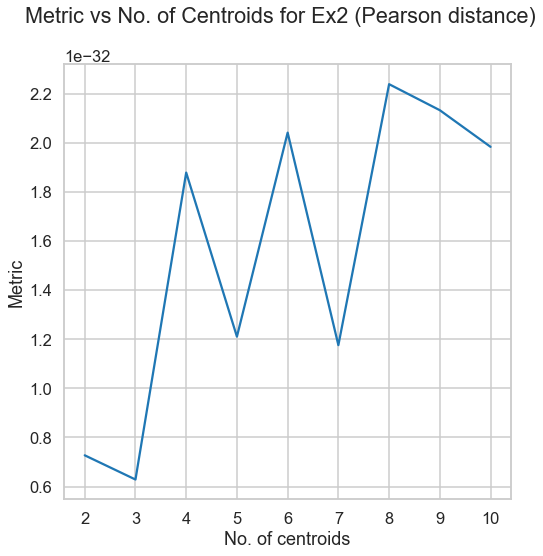

In [317]:
plt.plot(ks,pCluster_metrics3)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Ex2 (Pearson distance)')
plt.show()

## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

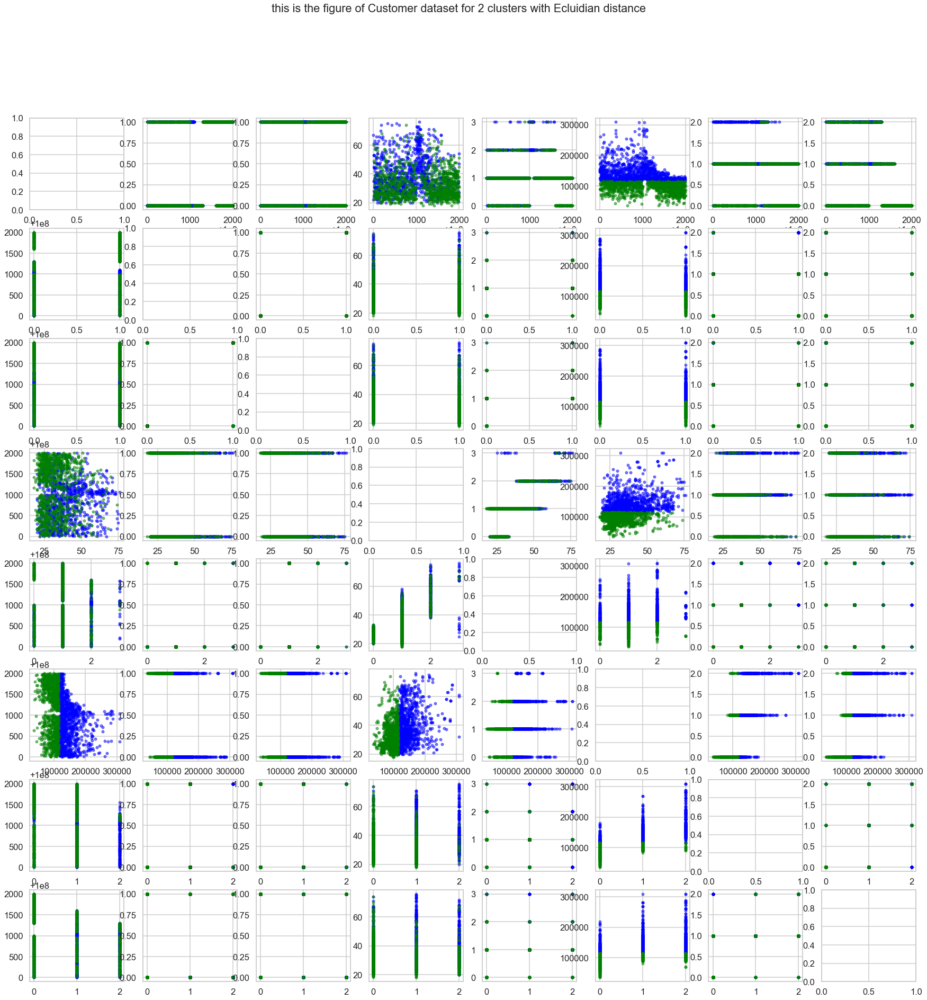

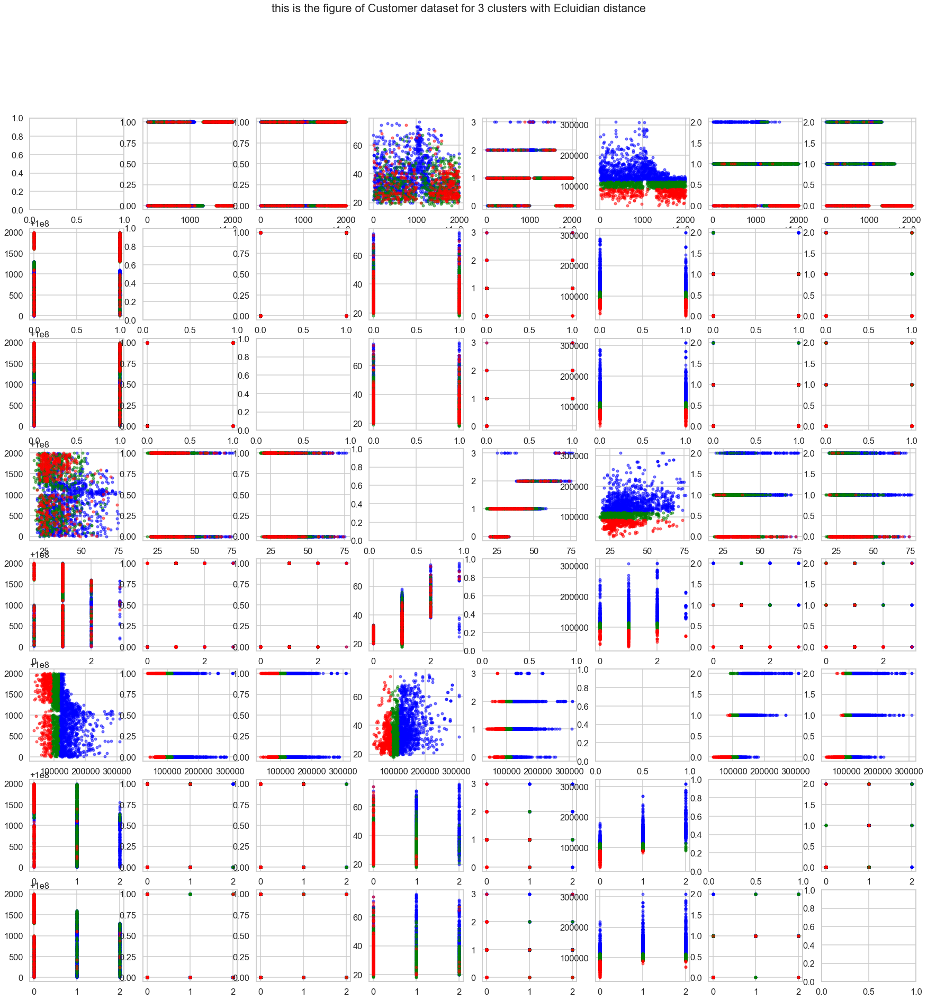

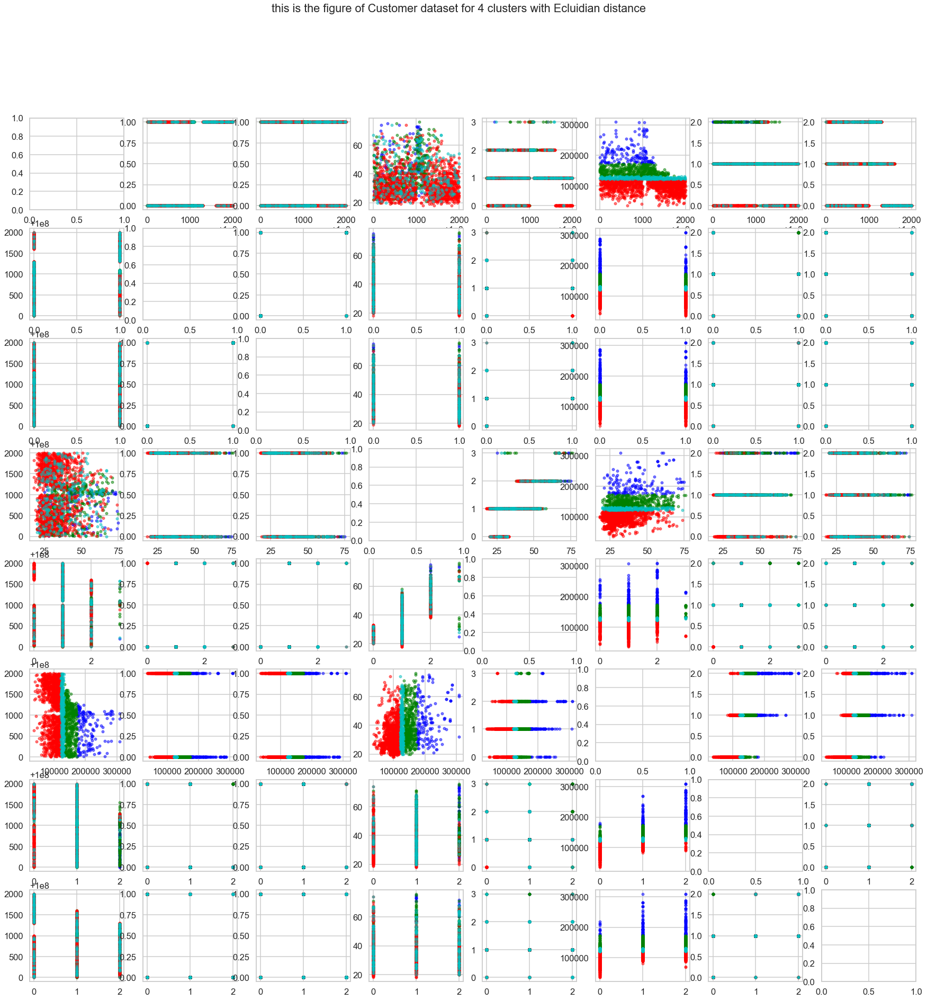

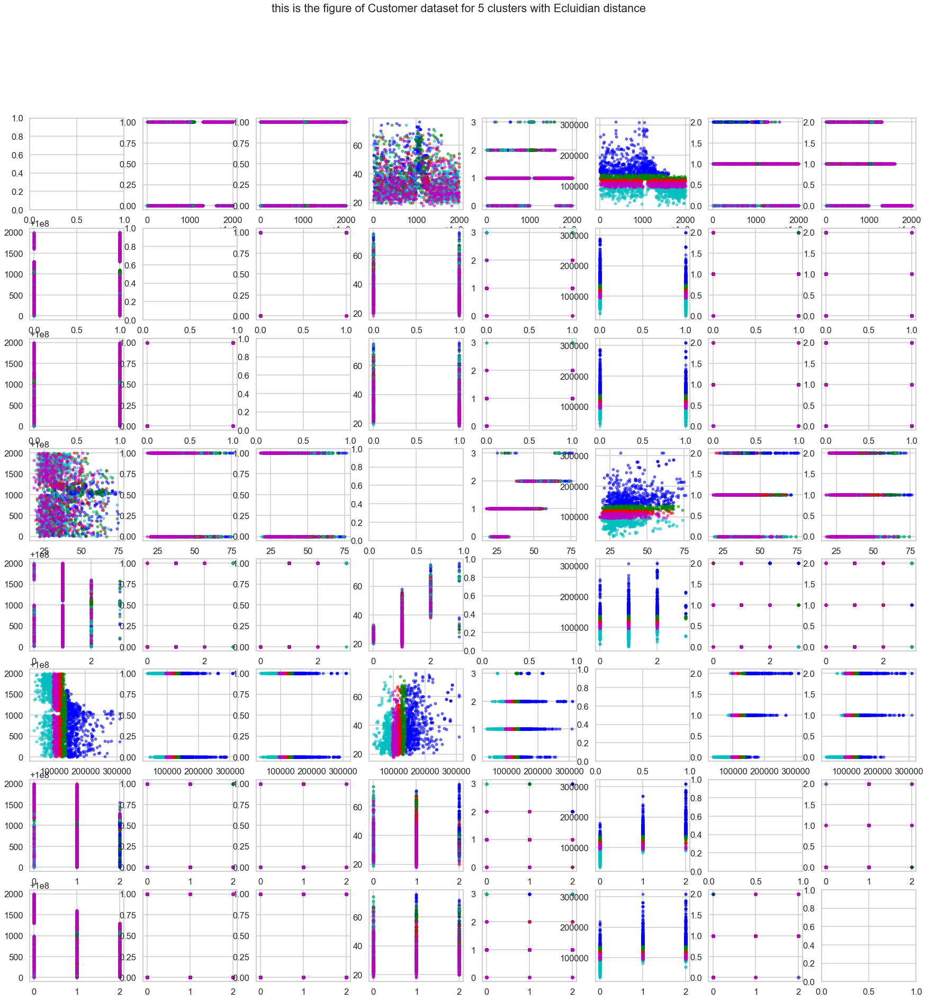

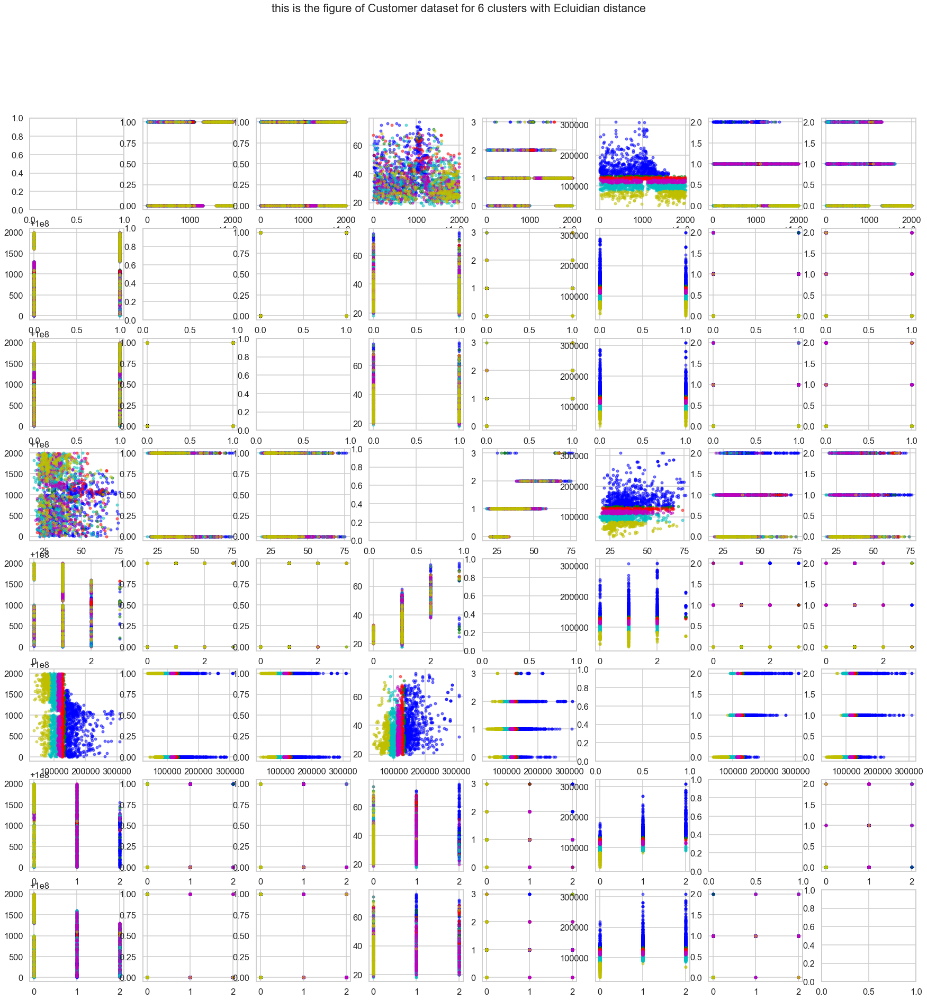

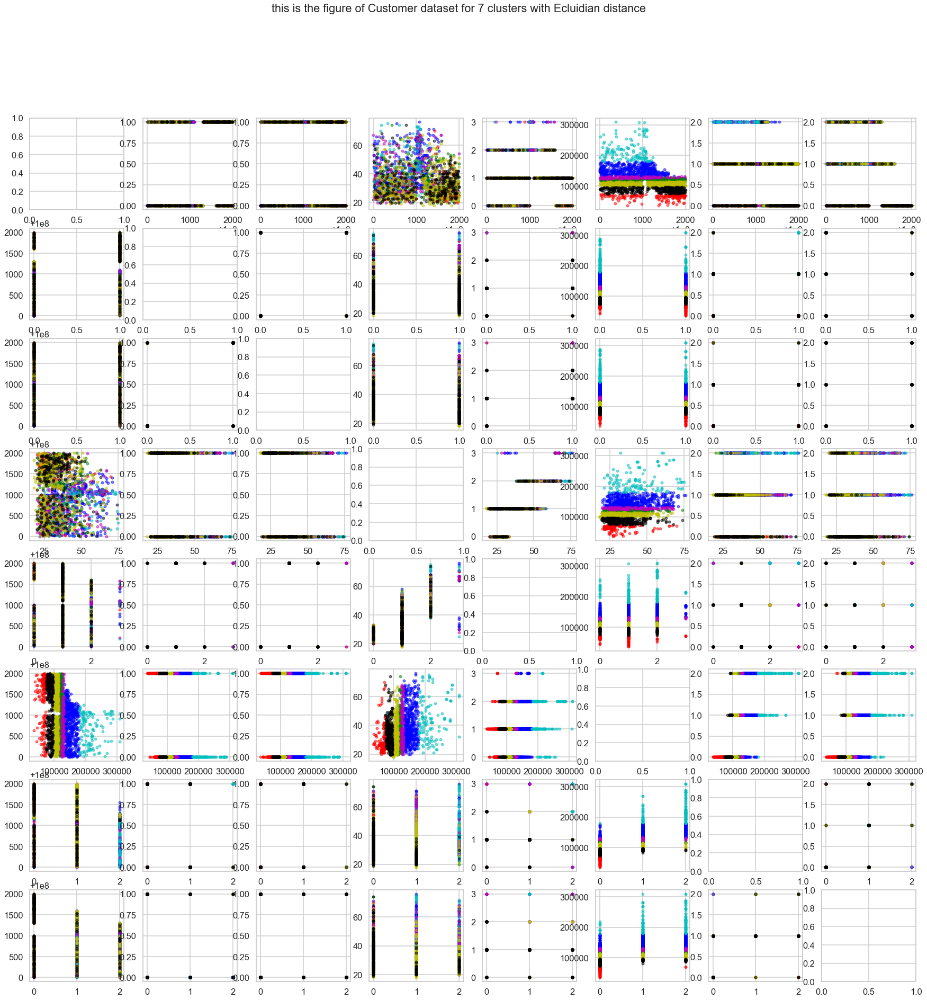

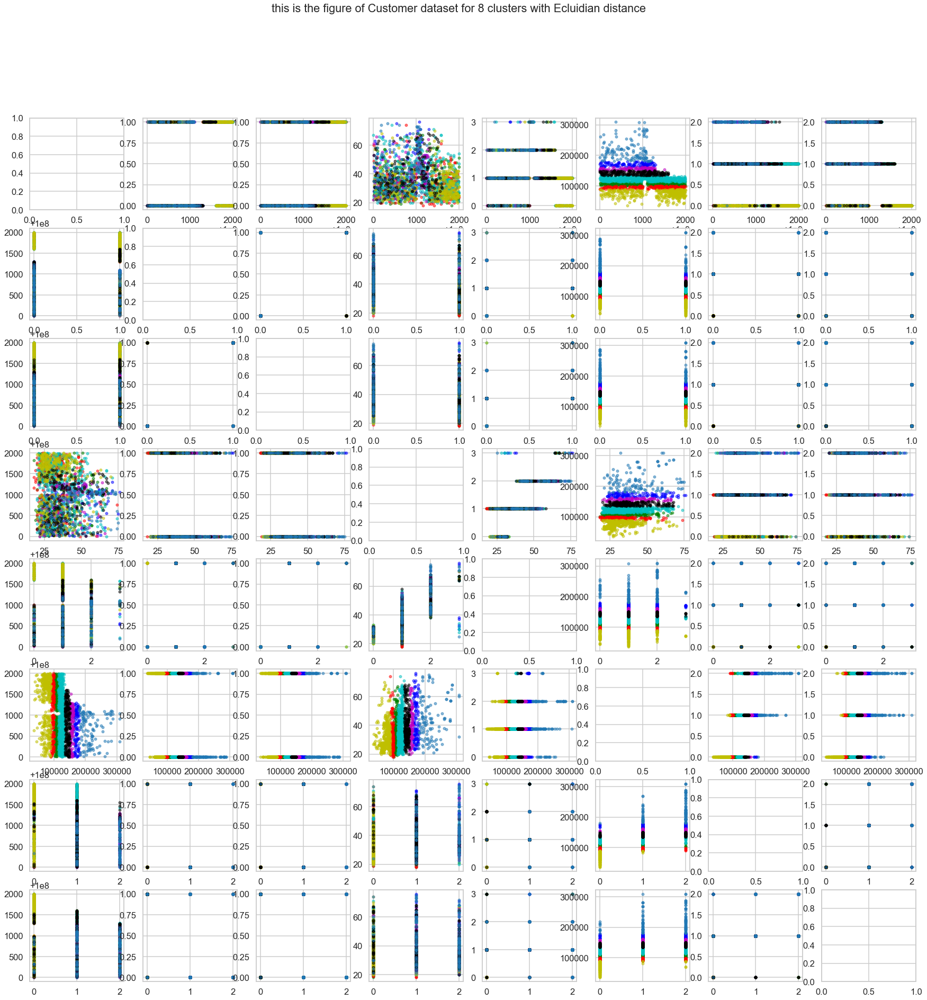

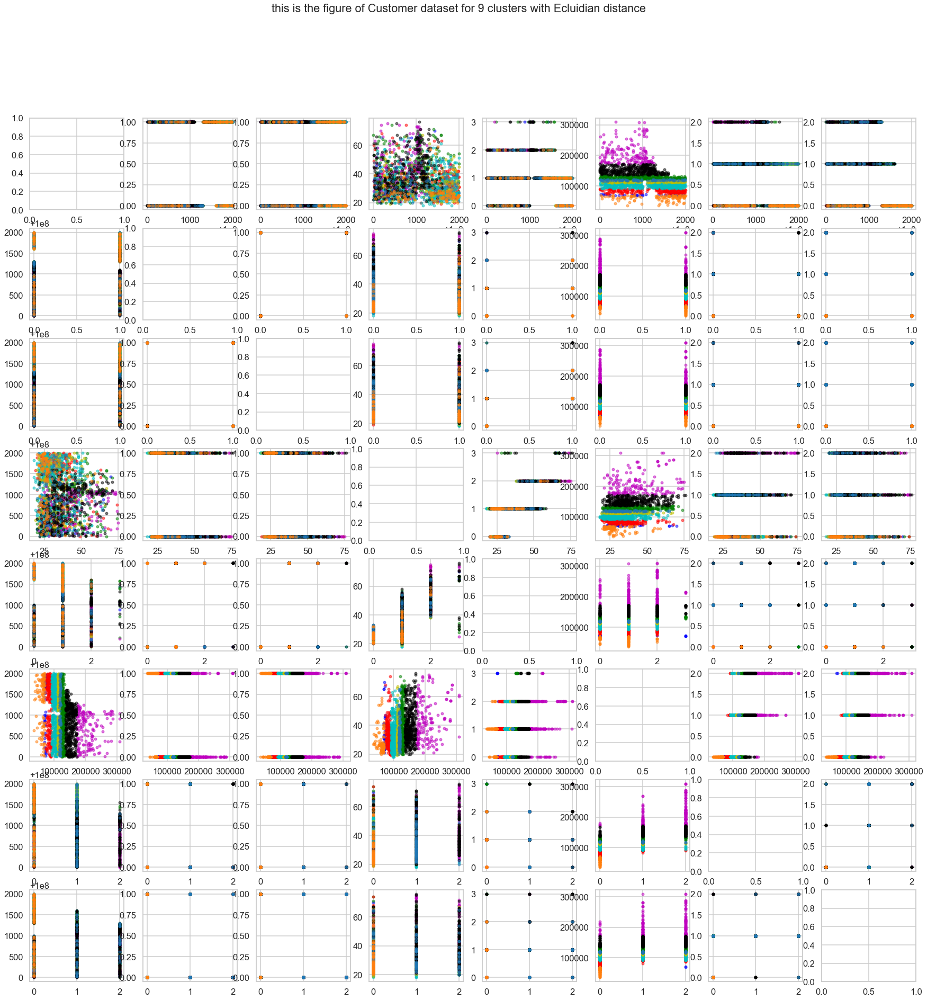

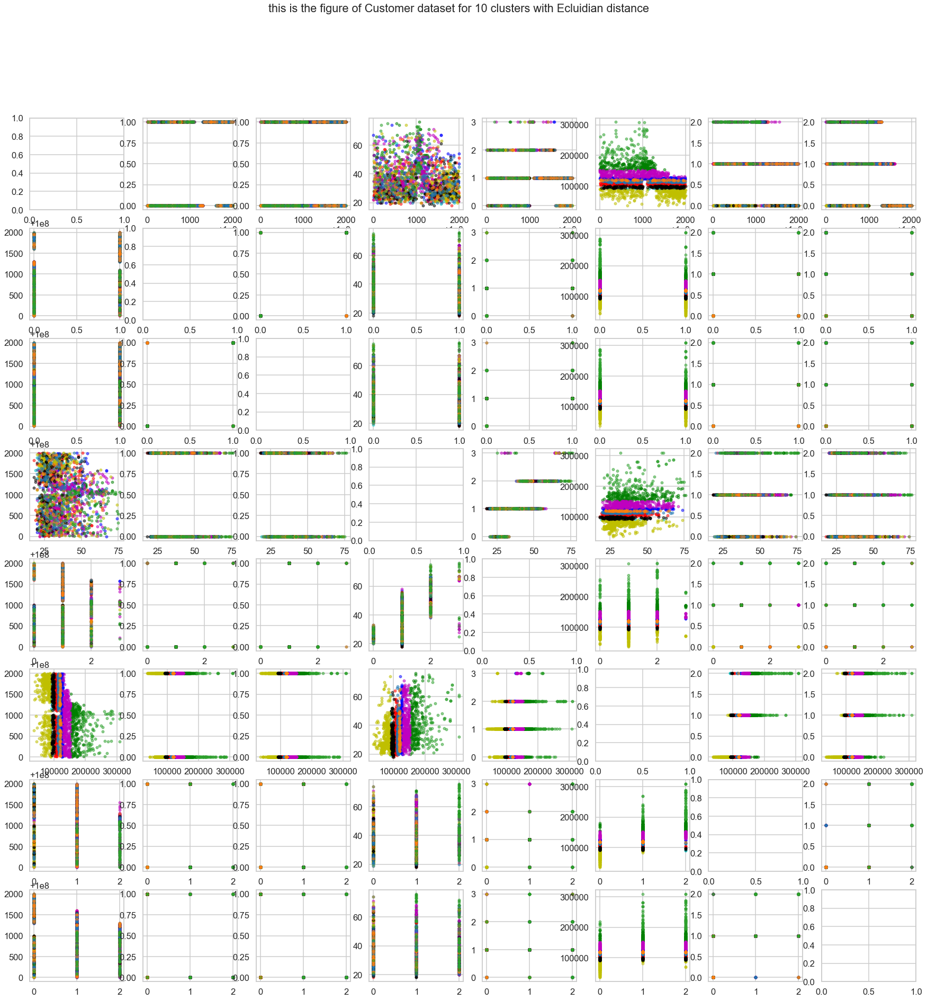

In [287]:
df = pd.read_csv('E:/sem 10/ML/Customer data.csv')
"""C_D , C_M = GUC_Kmean(Data_points=df.values, Number_of_Clusters=6, Distance_Type='Pearson')
display_cluster("dataset",df.values, km=C_D, num_clusters=6)"""

Cluster_metrics=[]

for i in ks:
    c_d, c_m = GUC_Kmean(Data_points=df.values, Number_of_Clusters=i, Distance_Type='Ecluidian')
    Cluster_metrics.append(c_m)
    display_cluster('Ecluidian',"Customer dataset",df.values, km=c_d, num_clusters=i)

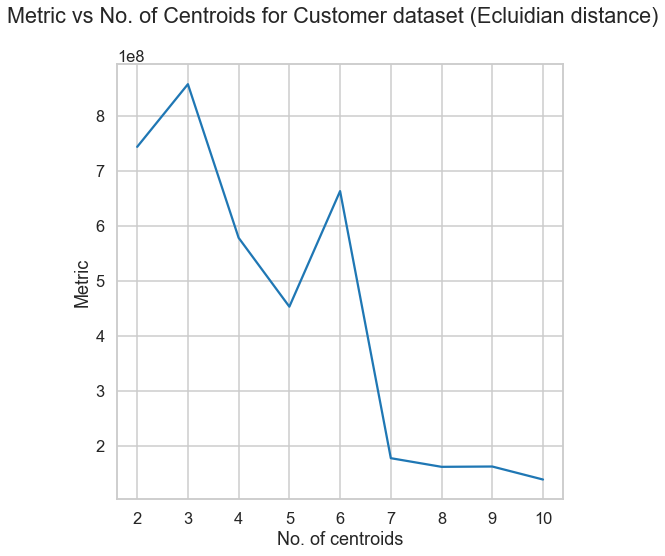

In [288]:
plt.plot(ks,Cluster_metrics)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Customer dataset (Ecluidian distance)')
plt.show()

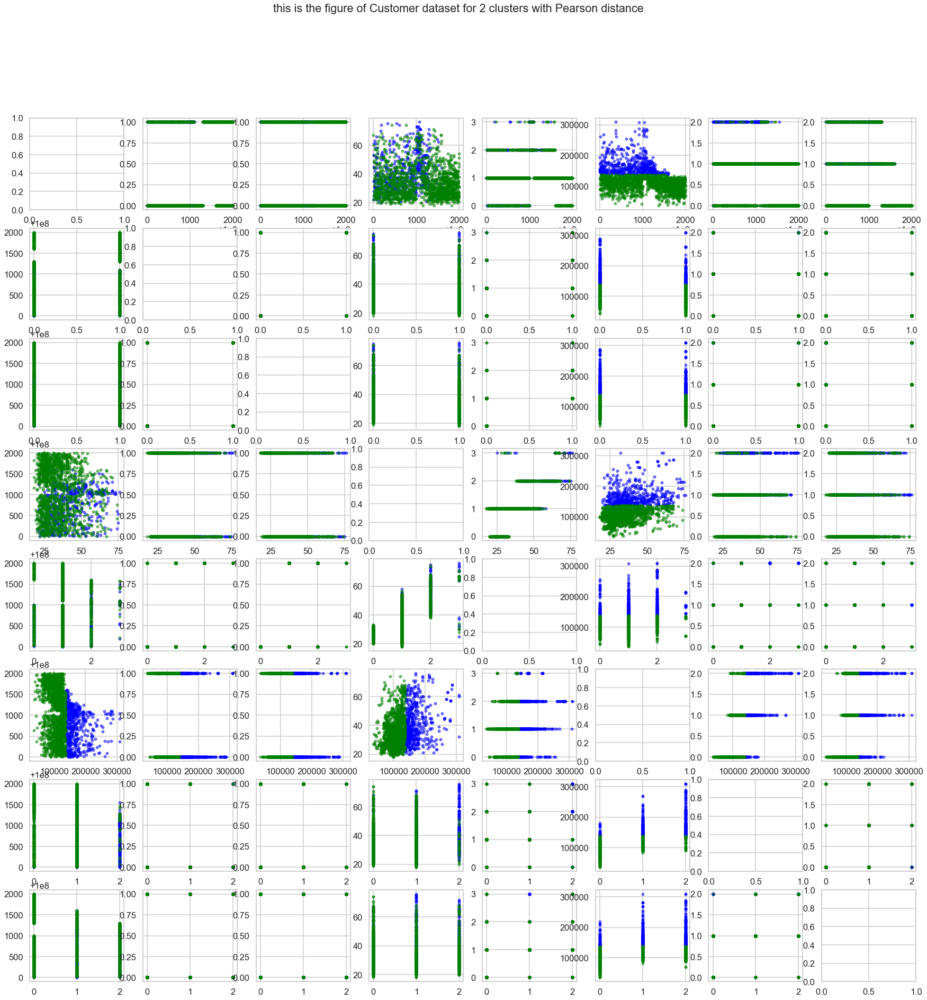

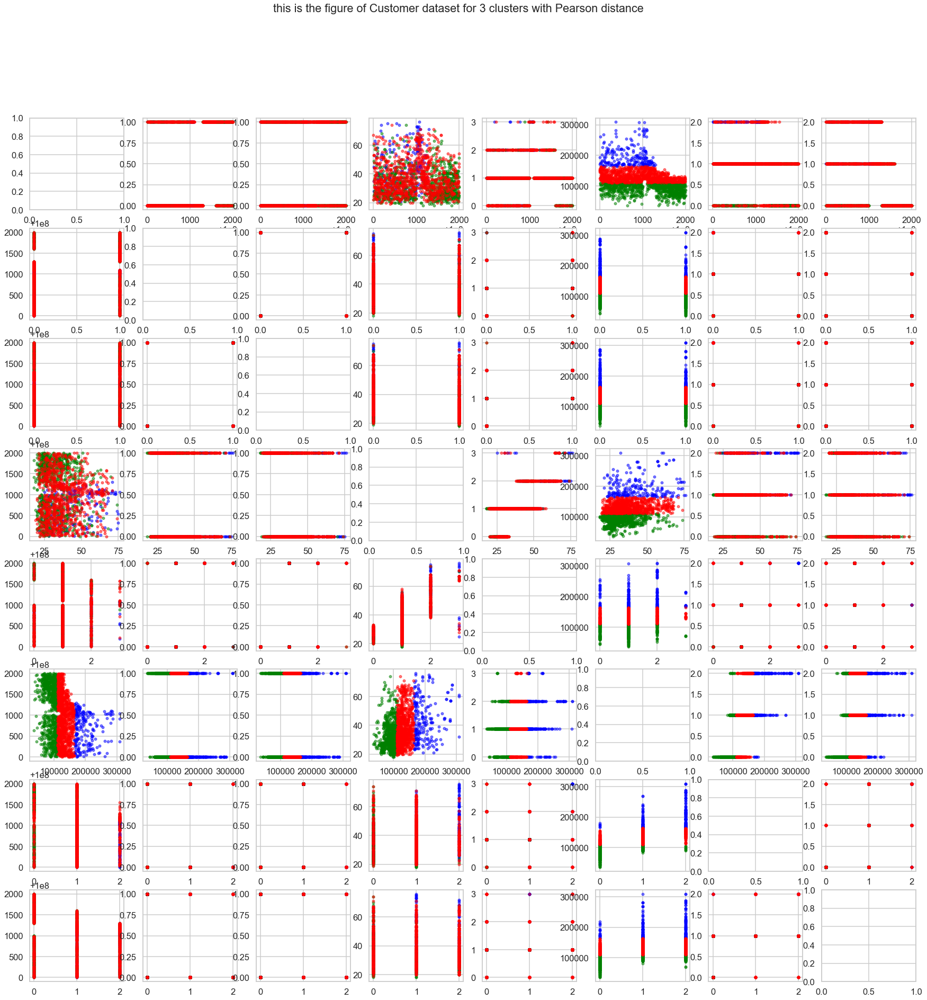

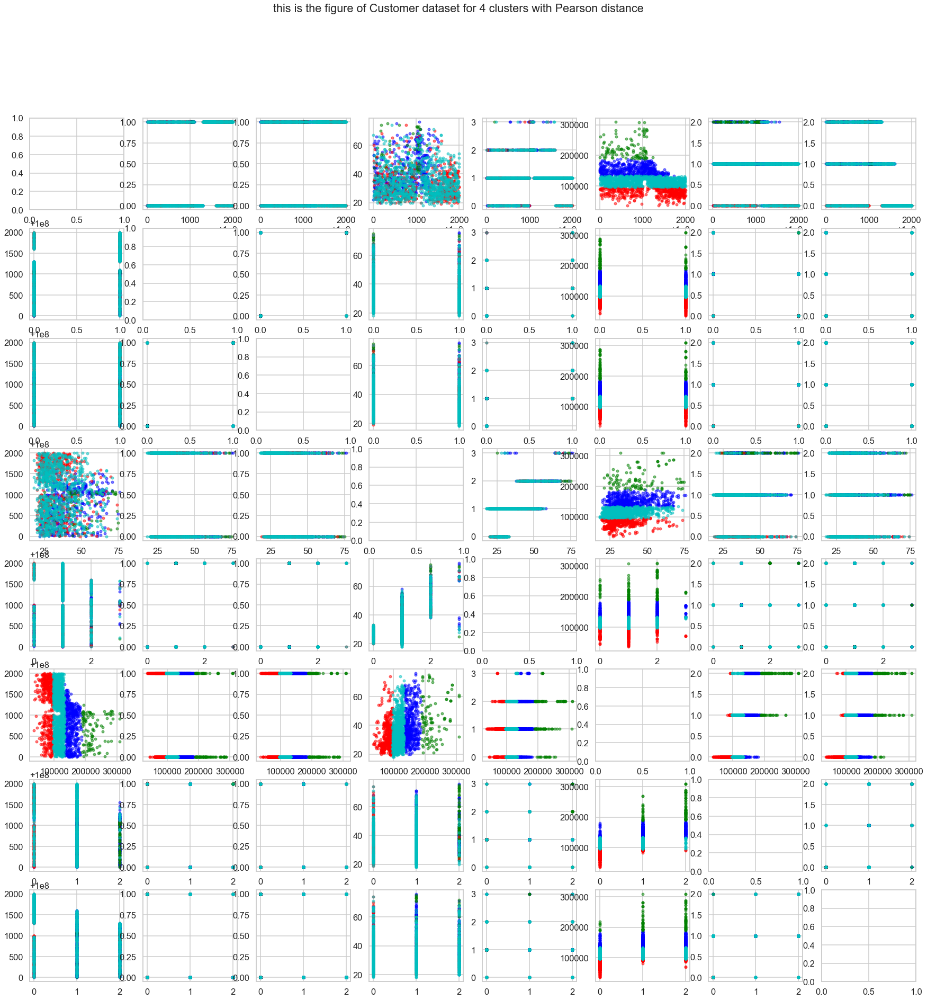

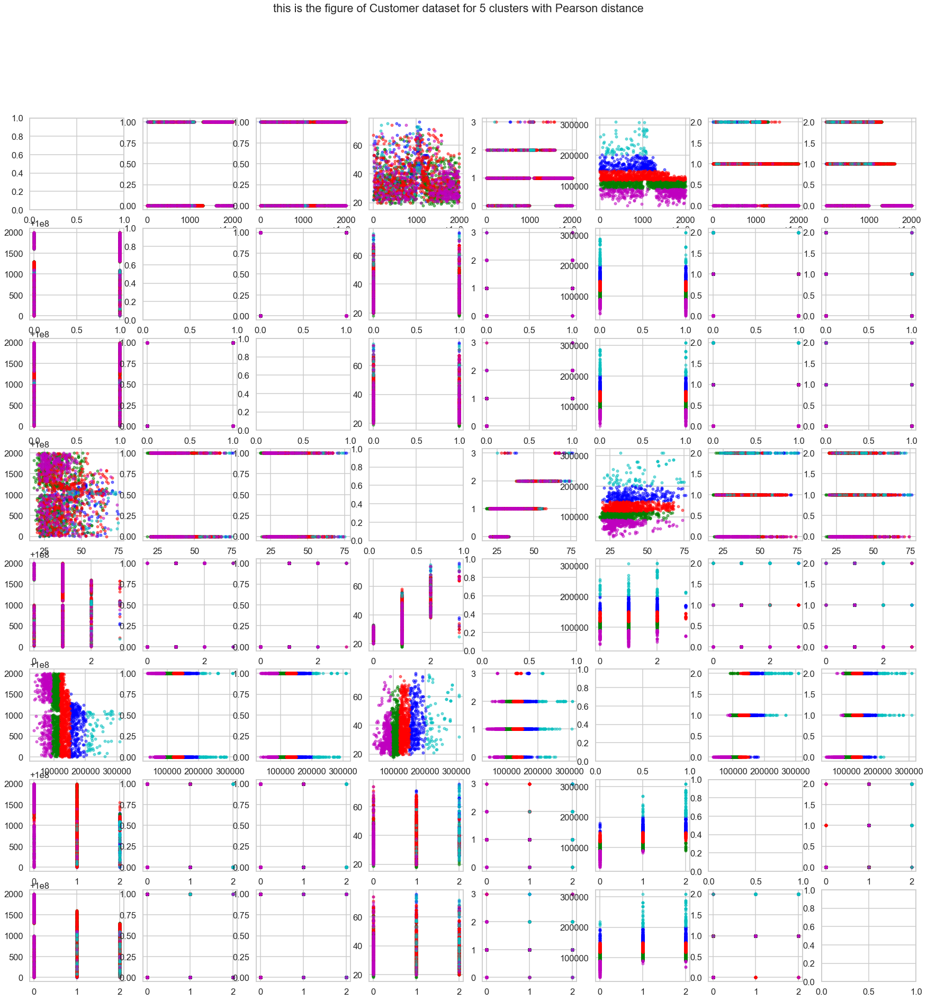

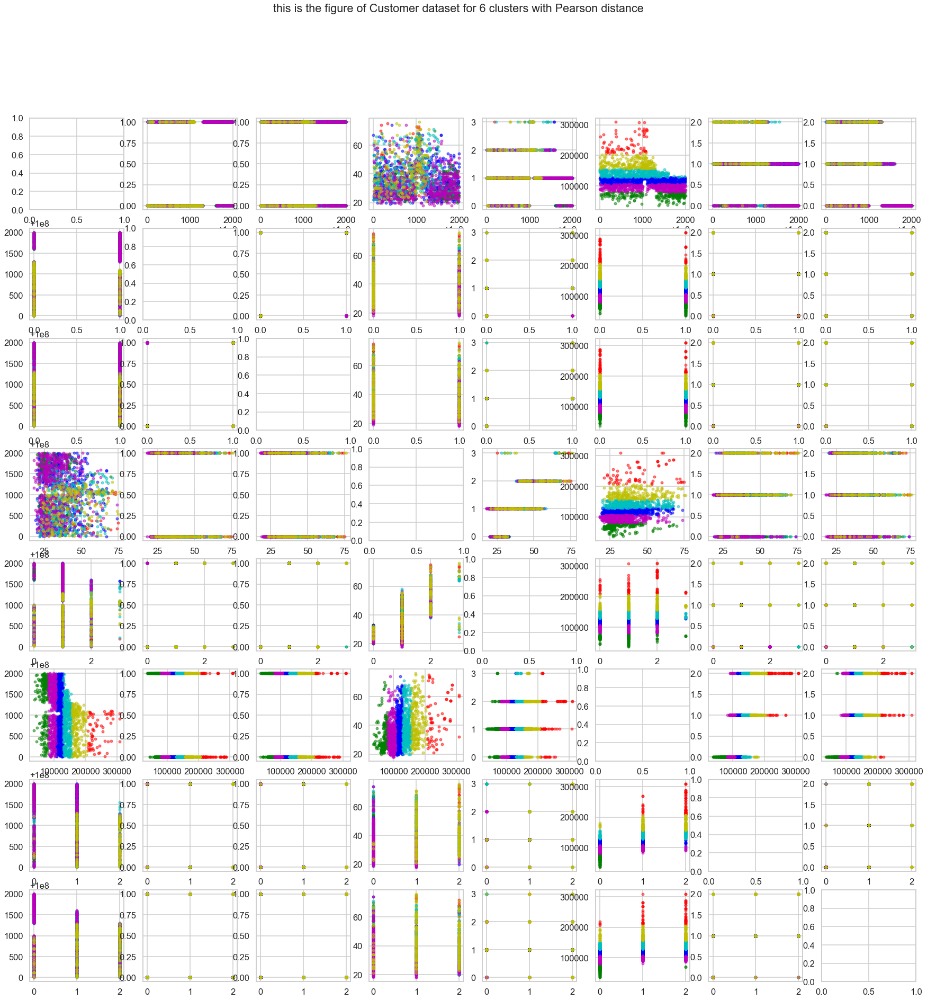

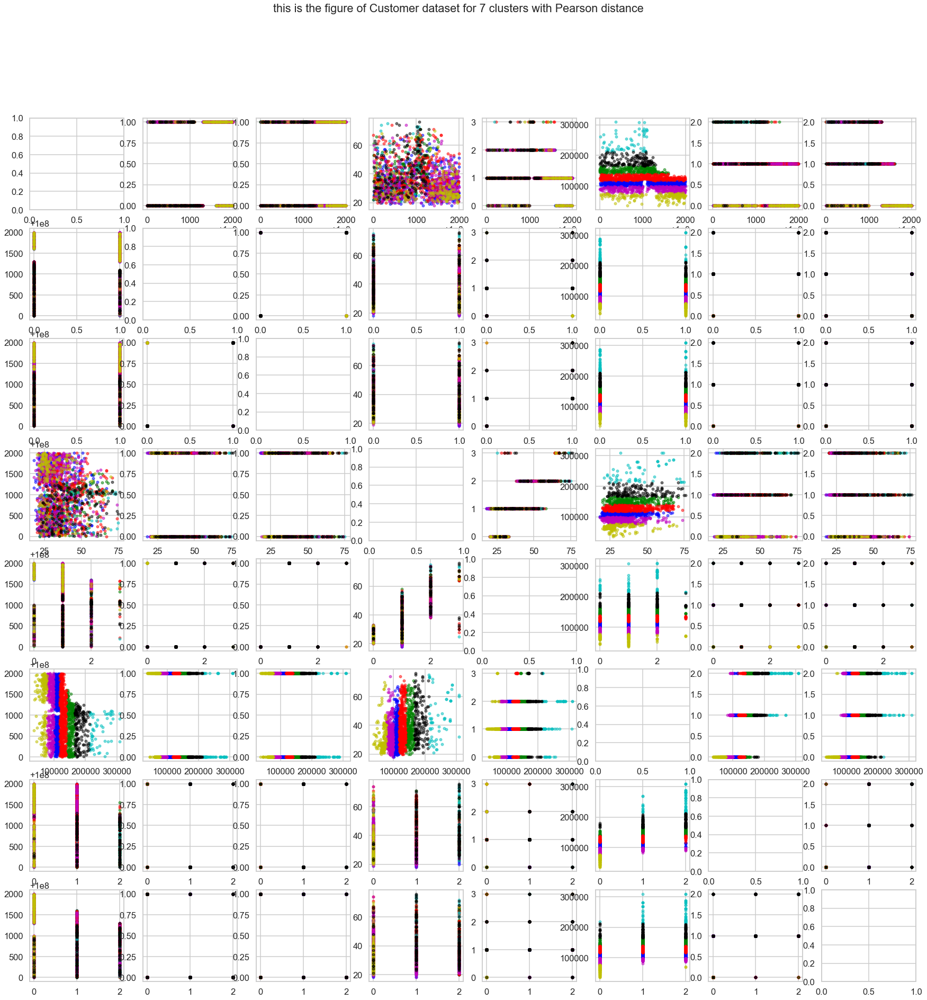

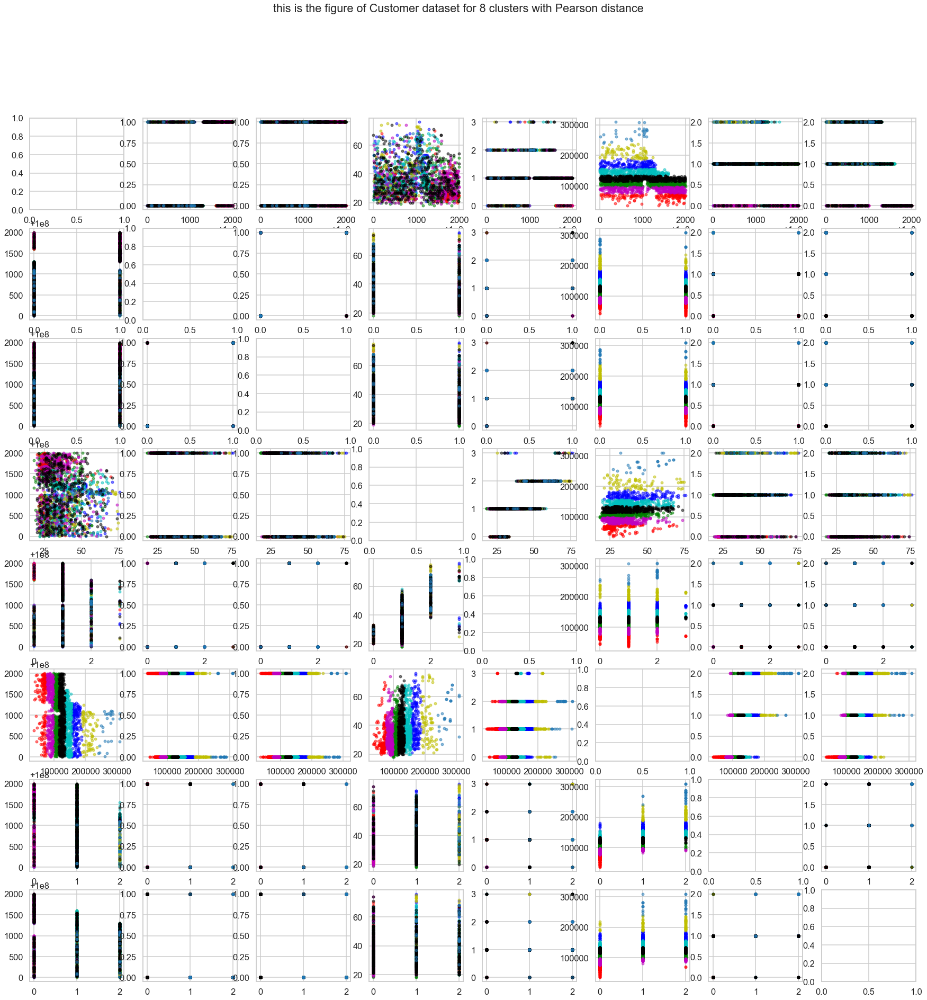

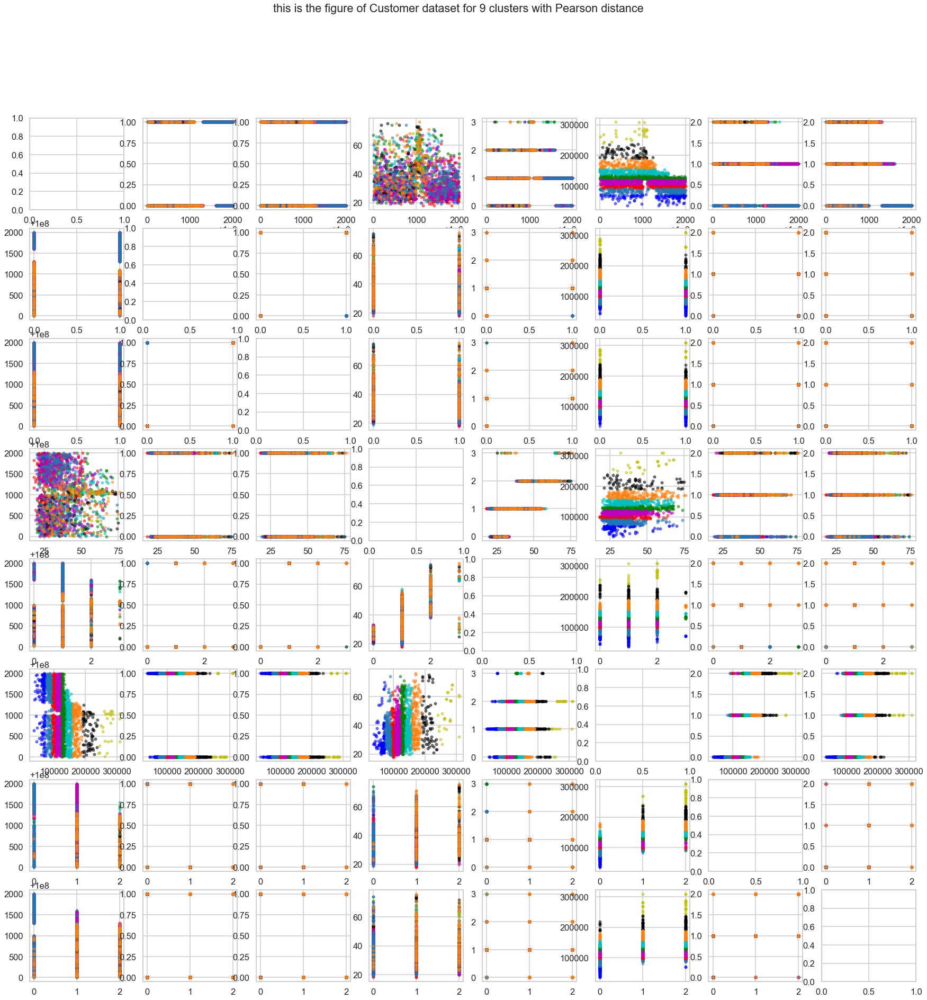

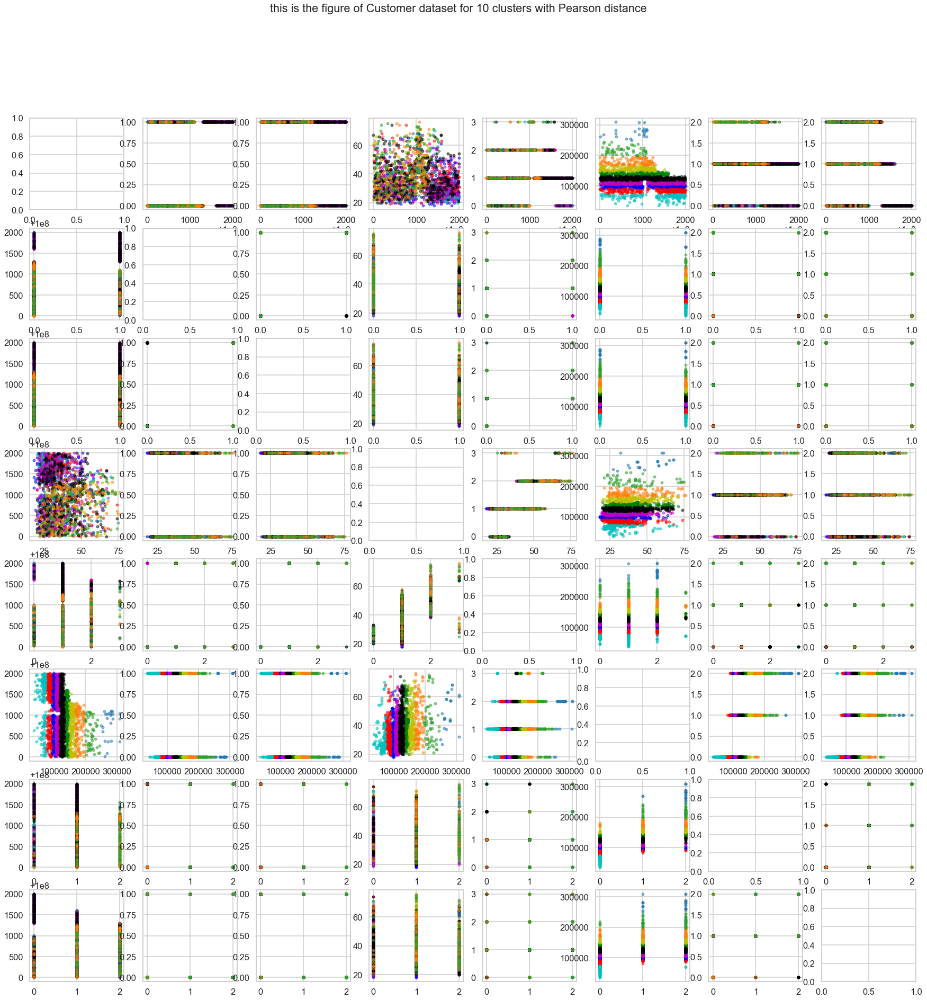

In [289]:
peCluster_metrics=[]

for i in ks:
    c_d, c_m = GUC_Kmean(Data_points=df.values, Number_of_Clusters=i, Distance_Type='Pearson')
    peCluster_metrics.append(c_m)
    display_cluster('Pearson',"Customer dataset",df.values, km=c_d, num_clusters=i)

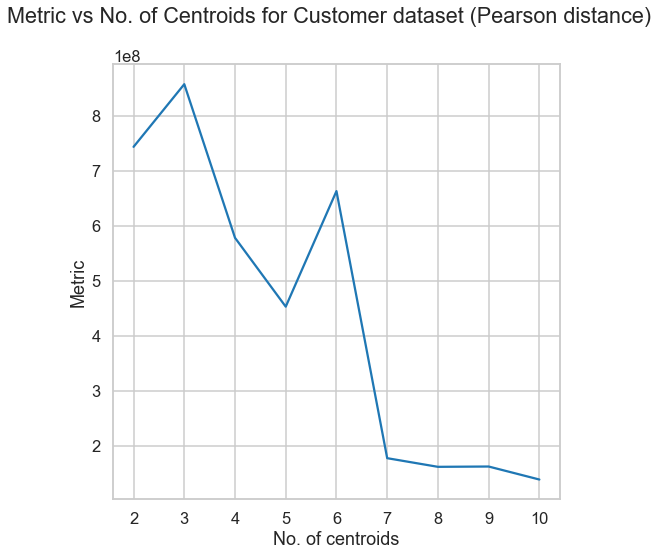

In [290]:
plt.plot(ks,Cluster_metrics)
plt.xlabel('No. of centroids')
plt.ylabel('Metric')
plt.suptitle('Metric vs No. of Centroids for Customer dataset (Pearson distance)')
plt.show()